In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import pandas as pd

In [2]:
data = pd.read_csv('train.csv')
l = data['label']
d = data.drop('label', axis=1)


In [3]:
print(l.shape)
print(d.shape)

(42000,)
(42000, 784)


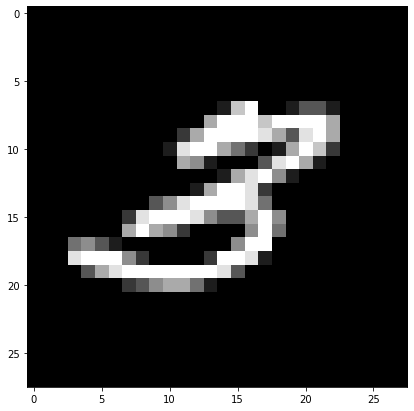

3


In [4]:
plt.figure(figsize=(7,7))
idx=1050

grid_data = d.iloc[idx].values.reshape(28,28)
plt.imshow(grid_data, interpolation='none',cmap='gray')
plt.show()

print(l[idx])


In [5]:
labels = l.head(15000)
data = d.head(15000)

In [6]:
from sklearn.preprocessing import StandardScaler

standardized_data = StandardScaler().fit_transform(data)
sample_data = standardized_data

In [7]:
# PCA from sklearn

from sklearn import decomposition
pca = decomposition.PCA()
pca.n_components = 2
pca_data = pca.fit_transform(sample_data)

pca_data.shape

(15000, 2)

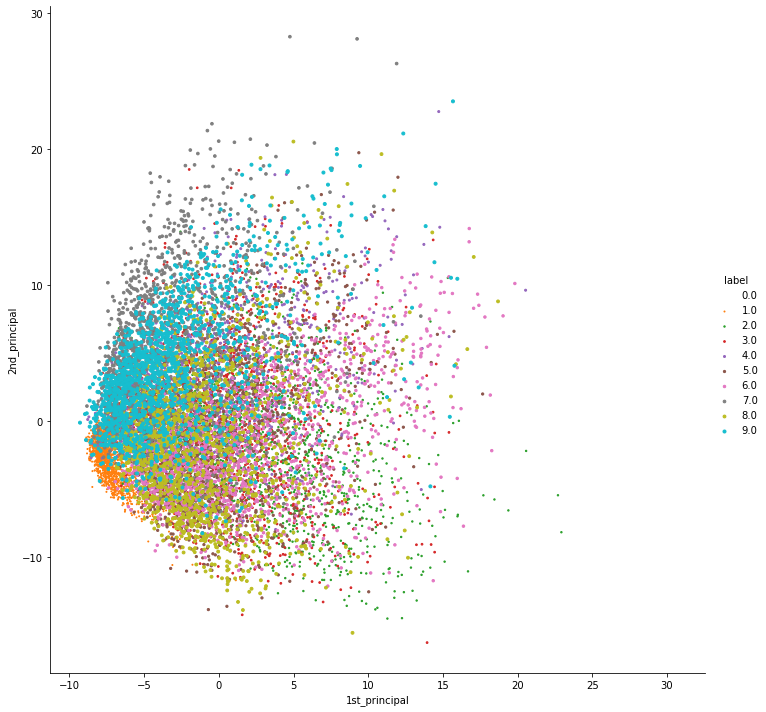

In [8]:
pca_data = np.vstack((pca_data.T,labels)).T  # vertical stack
pca_data.shape
pca_df = pd.DataFrame(data=pca_data, columns=("1st_principal","2nd_principal","label"))
sns.FacetGrid(pca_df,hue ='label',size=10).map(plt.scatter,'1st_principal','2nd_principal','label').add_legend()
plt.show()
# pca_df.head()


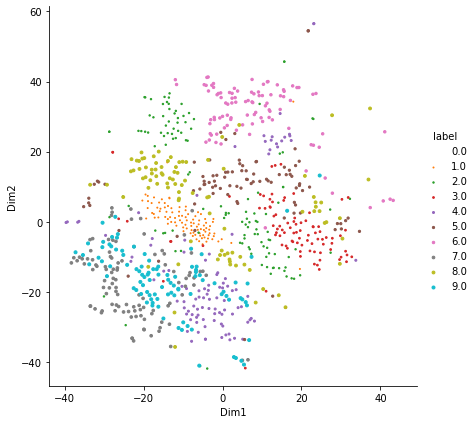

In [10]:
# TSNE IMPLEMENTATION
from sklearn.manifold import TSNE

# picking only 1000 points as tsne takes a lot of time for 15k points
data_1000 = standardized_data[0:1000,:]
label = labels[0:1000]

model = TSNE(n_components=2,random_state=0,perplexity=50,n_iter=5000)

tsne_data = model.fit_transform(data_1000)

tsne_data = np.vstack((tsne_data.T,label)).T
tsne_df = pd.DataFrame(data=tsne_data,columns=("Dim1",'Dim2','label'))

sns.FacetGrid(tsne_df,hue='label',size=6).map(plt.scatter,'Dim1','Dim2','label').add_legend()

plt.show()
